## Importing libraries

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveRegressor

In [25]:
data = pd.read_csv("C://Users//KIIT//OneDrive//Desktop//Instagram data.csv", encoding = 'latin1')

In [28]:
print(data.head())

   Impressions  From Home  From Hashtags  From Explore  From Other  Saves  \
0         3920       2586           1028           619          56     98   
1         5394       2727           1838          1174          78    194   
2         4021       2085           1188             0         533     41   
3         4528       2700            621           932          73    172   
4         2518       1704            255           279          37     96   

   Comments  Shares  Likes  Profile Visits  Follows  \
0         9       5    162              35        2   
1         7      14    224              48       10   
2        11       1    131              62       12   
3        10       7    213              23        8   
4         5       4    123               8        0   

                                             Caption  \
0  Here are some of the most important data visua...   
1  Here are some of the best data science project...   
2  Learn how to train a machine learni

In [30]:
data.isnull().sum()

Impressions       0
From Home         0
From Hashtags     0
From Explore      0
From Other        0
Saves             0
Comments          0
Shares            0
Likes             0
Profile Visits    0
Follows           0
Caption           0
Hashtags          0
dtype: int64

In [32]:
data = data.dropna()

In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119 entries, 0 to 118
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Impressions     119 non-null    int64 
 1   From Home       119 non-null    int64 
 2   From Hashtags   119 non-null    int64 
 3   From Explore    119 non-null    int64 
 4   From Other      119 non-null    int64 
 5   Saves           119 non-null    int64 
 6   Comments        119 non-null    int64 
 7   Shares          119 non-null    int64 
 8   Likes           119 non-null    int64 
 9   Profile Visits  119 non-null    int64 
 10  Follows         119 non-null    int64 
 11  Caption         119 non-null    object
 12  Hashtags        119 non-null    object
dtypes: int64(11), object(2)
memory usage: 12.2+ KB


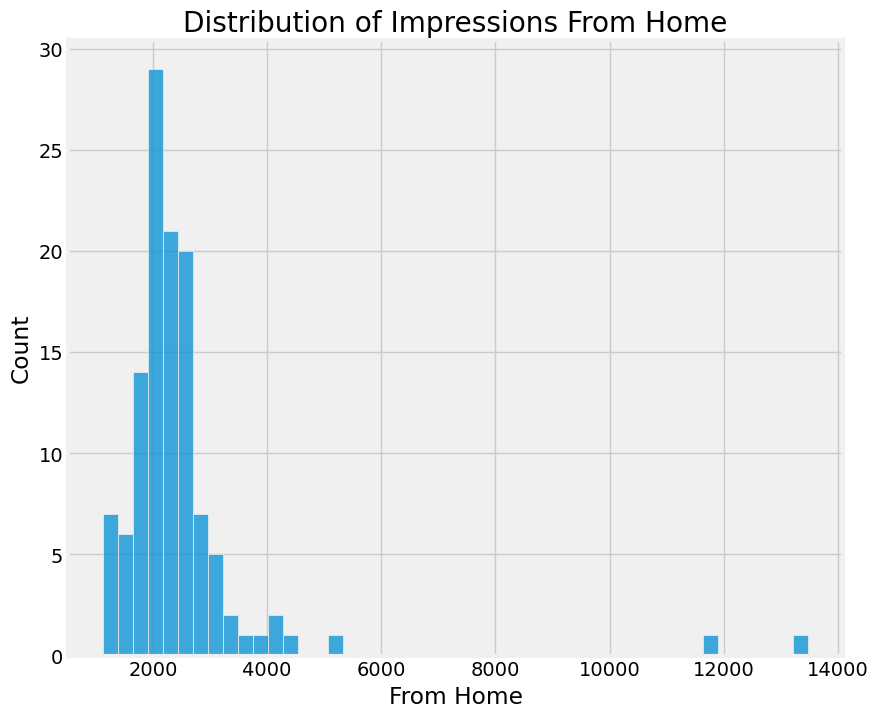

In [36]:
plt.figure(figsize=(10, 8))
plt.style.use('fivethirtyeight')
plt.title("Distribution of Impressions From Home")
#sns.distplot(data['From Home'])
sns.histplot(data['From Home'])
plt.show()

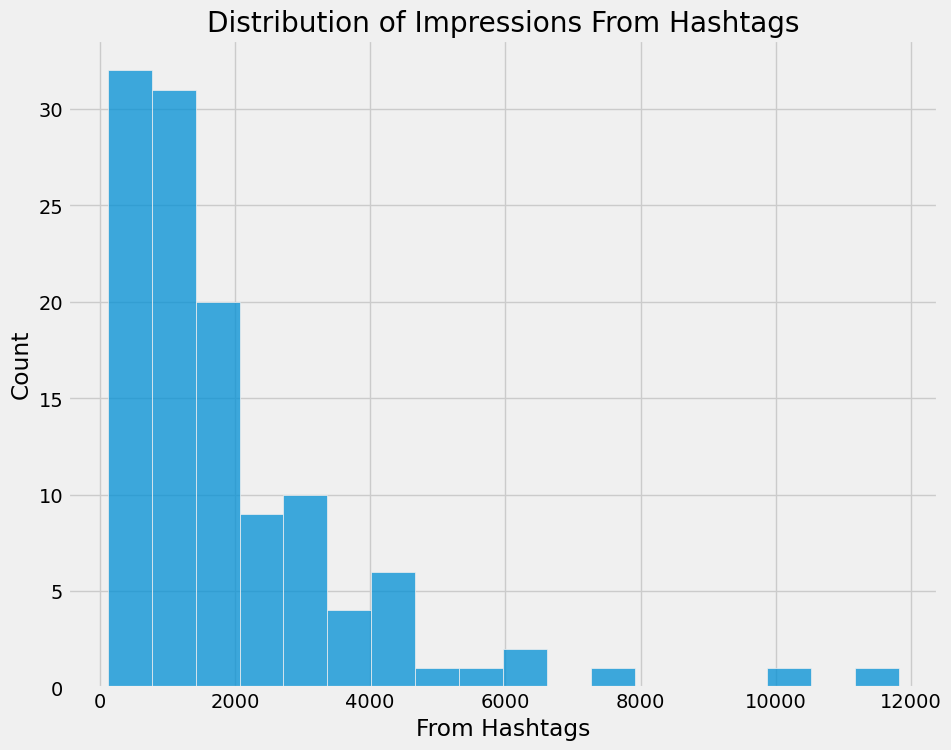

In [38]:
plt.figure(figsize=(10, 8))
plt.title("Distribution of Impressions From Hashtags")
#sns.distplot(data['From Hashtags'])
sns.histplot(data['From Hashtags'])
plt.show()

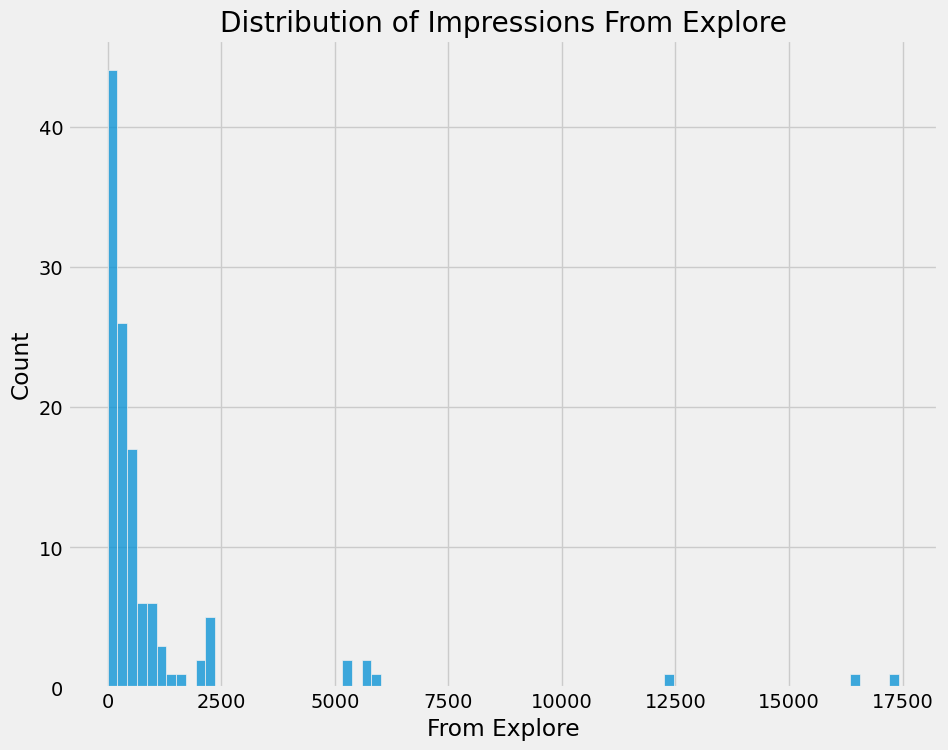

In [40]:
plt.figure(figsize=(10, 8))
plt.title("Distribution of Impressions From Explore")
#sns.distplot(data['From Explore'])
sns.histplot(data['From Explore'])
plt.show()

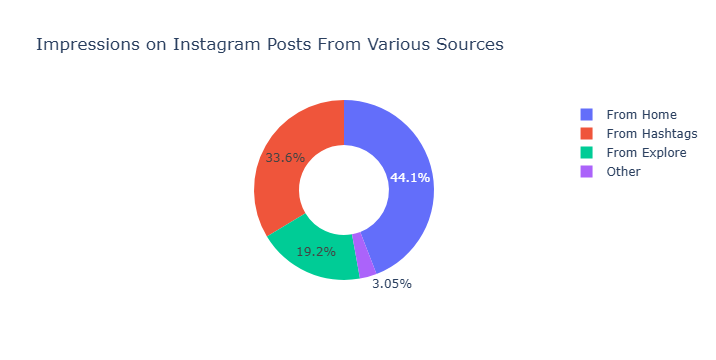

In [42]:
home = data["From Home"].sum()
hashtags = data["From Hashtags"].sum()
explore = data["From Explore"].sum()
other = data["From Other"].sum()

labels = ['From Home','From Hashtags','From Explore','Other']
values = [home, hashtags, explore, other]

fig = px.pie(data, values=values, names=labels, 
             title='Impressions on Instagram Posts From Various Sources', hole=0.5)
fig.show()

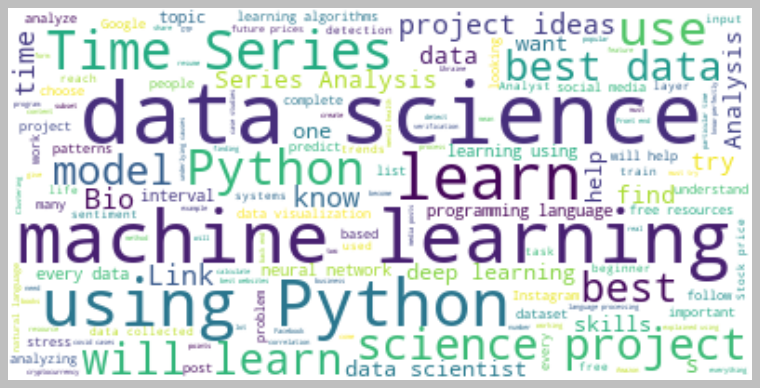

In [44]:
text = " ".join(i for i in data.Caption)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
plt.style.use('classic')
plt.figure( figsize=(12,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

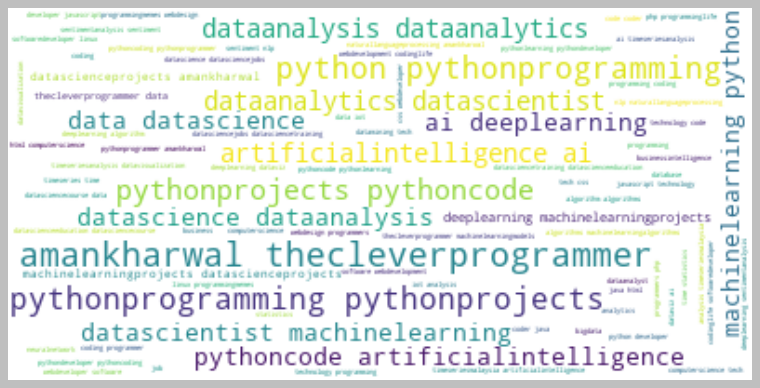

In [46]:
text = " ".join(i for i in data.Hashtags)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
plt.figure( figsize=(12,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

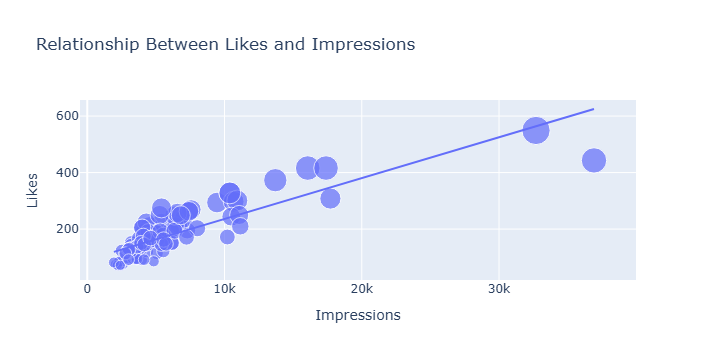

In [48]:
figure = px.scatter(data_frame = data, x="Impressions",
                    y="Likes", size="Likes", trendline="ols", 
                    title = "Relationship Between Likes and Impressions")
figure.show()

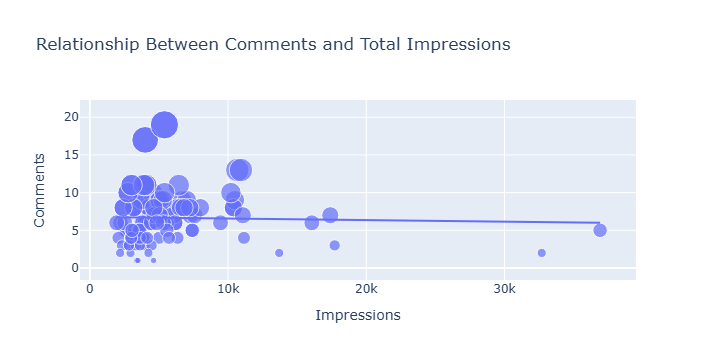

In [50]:
figure = px.scatter(data_frame = data, x="Impressions",
                    y="Comments", size="Comments", trendline="ols", 
                    title = "Relationship Between Comments and Total Impressions")
figure.show()

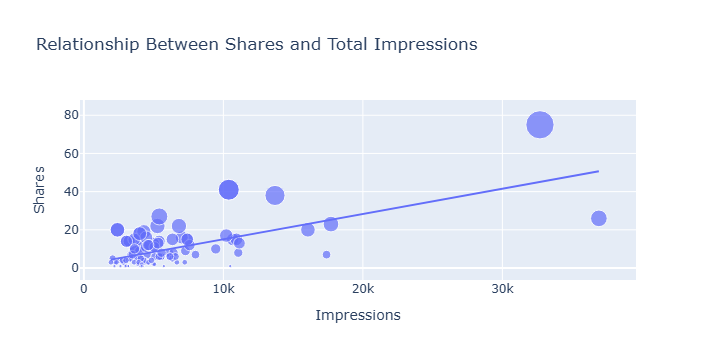

In [52]:
figure = px.scatter(data_frame = data, x="Impressions",
                    y="Shares", size="Shares", trendline="ols", 
                    title = "Relationship Between Shares and Total Impressions")
figure.show()

In [58]:
corr = data.corr()
print(corr["Impressions"].sort_values(ascending=False))

ValueError: could not convert string to float: 'Here are some of the most important data visualizations that every Financial Data Analyst/Scientist should know.'

In [56]:
conversion_rate = (data["Follows"].sum() / data["Profile Visits"].sum()) * 100
print(conversion_rate)

41.00265604249668


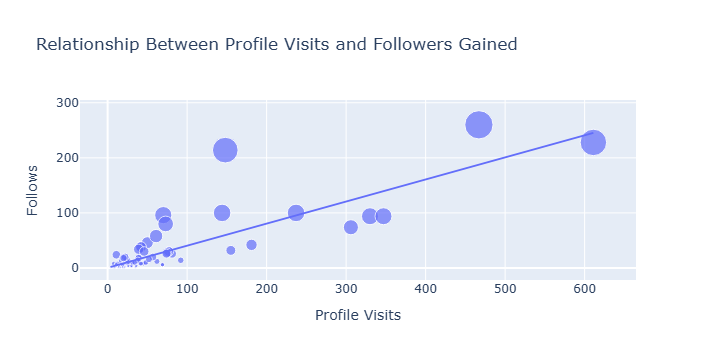

In [60]:
figure = px.scatter(data_frame = data, x="Profile Visits",
                    y="Follows", size="Follows", trendline="ols", 
                    title = "Relationship Between Profile Visits and Followers Gained")
figure.show()

In [72]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Initialize OneHotEncoder with the correct parameter
encoder_caption = OneHotEncoder(sparse_output=False)
encoder_hashtags = OneHotEncoder(sparse_output=False)

# Fit and transform categorical columns
encoded_captions = encoder_caption.fit_transform(data[['Caption']])
encoded_hashtags = encoder_hashtags.fit_transform(data[['Hashtags']])

# Convert encoded arrays to DataFrames for easier handling
encoded_captions_df = pd.DataFrame(encoded_captions, columns=encoder_caption.get_feature_names_out(['Caption']))
encoded_hashtags_df = pd.DataFrame(encoded_hashtags, columns=encoder_hashtags.get_feature_names_out(['Hashtags']))

# Drop original columns and concatenate encoded columns
data = data.drop(['Caption', 'Hashtags'], axis=1)
data = pd.concat([data.reset_index(drop=True), encoded_captions_df.reset_index(drop=True), encoded_hashtags_df.reset_index(drop=True)], axis=1)

# Save the preprocessed data
data.to_csv("preprocessed_instagram_data.csv", index=False)


In [82]:
# Adding new features: Engagement Rate and Hashtag Density
data['Engagement Rate'] = (data['Likes'] + data['Comments'] + data['Shares']) / data['Impressions']
data['Hashtag Density'] = data['Hashtag'].apply(lambda x: len(x.split('#')) - 1)

# Save the updated dataset
data.to_csv("feature_engineered_instagram_data.csv", index=False)

KeyError: 'Hashtag'

In [76]:
from sklearn.model_selection import train_test_split

# Assuming 'Impressions' is the target variable and the rest are features
X = data.drop(['Impressions'], axis=1)
y = data['Impressions']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Save the split data
X_train.to_csv("X_train.csv", index=False)
X_test.to_csv("X_test.csv", index=False)
y_train.to_csv("y_train.csv", index=False)
y_test.to_csv("y_test.csv", index=False)

In [78]:
from sklearn.linear_model import LinearRegression
import joblib

# Train a predictive model
model = LinearRegression()
model.fit(X_train, y_train)

# Save the trained model
joblib.dump(model, "instagram_model.pkl")

['instagram_model.pkl']

In [80]:
# Correlation analysis after preprocessing
numeric_data = data.select_dtypes(include=['int64', 'float64'])
corr = numeric_data.corr()
print(corr["Impressions"].sort_values(ascending=False))

Impressions                                                                                                                                                                                                                                                                                                                                                               1.000000
From Explore                                                                                                                                                                                                                                                                                                                                                              0.893607
Follows                                                                                                                                                                                                                                                           

In [88]:
print(data.nunique())

Impressions                                                                                                                                                                                                                                                                                                      101
From Home                                                                                                                                                                                                                                                                                                         97
From Hashtags                                                                                                                                                                                                                                                                                                    100
From Explore                                                             

In [86]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Impressions,119.0,5703.991597,4843.780105,1941.000000,3467.000000,4289.000000,6138.000000,36919.00000
From Home,119.0,2475.789916,1489.386348,1133.000000,1945.000000,2207.000000,2602.500000,13473.00000
From Hashtags,119.0,1887.512605,1884.361443,116.000000,726.000000,1278.000000,2363.500000,11817.00000
From Explore,119.0,1078.100840,2613.026132,0.000000,157.500000,326.000000,689.500000,17414.00000
From Other,119.0,171.092437,289.431031,9.000000,38.000000,74.000000,196.000000,2547.00000
...,...,...,...,...,...,...,...,...
Hashtags_#sql #mysql #datascience #datasciencejobs #datasciencetraining #datascienceeducation #datasciencecourse #data #dataanalysis #dataanalytics #datascientist #machinelearning #artificialintelligence #ai #deeplearning #machinelearningprojects #datascienceprojects #amankharwal #thecleverprogrammer,119.0,0.008403,0.091670,0.000000,0.000000,0.000000,0.000000,1.00000
Hashtags_#stockmarket #investing #stocks #trading #money #investment #finance #forex #datavisualization #datascience #data #dataanalytics #machinelearning #dataanalysis #ai #candlestick #candlestickcharts,119.0,0.008403,0.091670,0.000000,0.000000,0.000000,0.000000,1.00000
Hashtags_#stockmarket #investing #stocks #trading #money #investment #finance #forex #datavisualization #datascience #data #dataanalytics #machinelearning #dataanalysis #ai #candlestick #candlestickcharts #amankharwal #thecleverprogrammer,119.0,0.008403,0.091670,0.000000,0.000000,0.000000,0.000000,1.00000
Hashtags_#timeseries #time #statistics #datascience #bigdata #machinelearning #python #ai #timeseriesanalysis #datavisualization #dataanalytics #data #iot #analysis #timeseriesmalaysia #artificialintelligence #analytics #amankharwal #thecleverprogrammer,119.0,0.050420,0.219736,0.000000,0.000000,0.000000,0.000000,1.00000


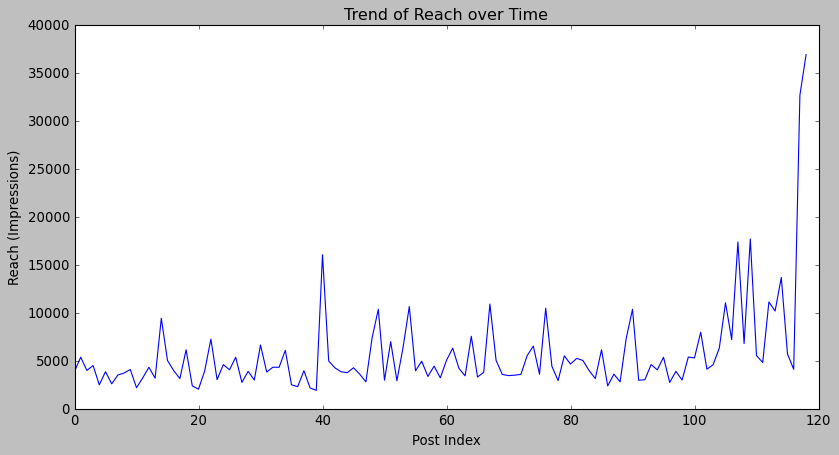

In [94]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=data.index, y=data['Impressions'])
plt.xlabel('Post Index')
plt.ylabel('Reach (Impressions)')
plt.title('Trend of Reach over Time')
plt.show()

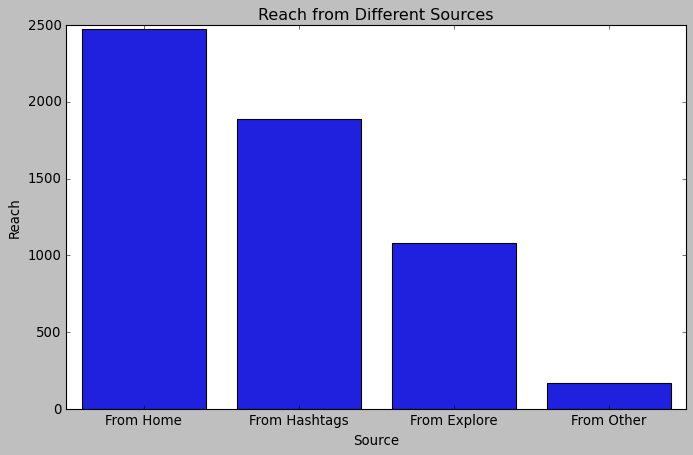

In [100]:
plt.figure(figsize=(10, 6))
sns.barplot(x=['From Home', 'From Hashtags', 'From Explore', 'From Other'],
            y=[data['From Home'].mean(), data['From Hashtags'].mean(), data['From Explore'].mean(), data['From Other'].mean()])
plt.xlabel('Source')
plt.ylabel('Reach')
plt.title('Reach from Different Sources')
plt.show()

In [102]:
# Analyze correlations between features
plt.figure(figsize=(100, 80))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

C:\Users\KIIT\anaconda3\Lib\site-packages\seaborn\utils.py:61: UserWarning:

Glyph 146 (\x92) missing from current font.

C:\Users\KIIT\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 146 (\x92) missing from current font.

